# Download Dataset

In [28]:
from google.colab import files
files.upload()

{}

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k # download dataset

In [ ]:
! mkdir flickr8k
! unzip flickr8k.zip -d flickr8k

In [30]:
RESIZE = 356
CROP = 299

In [31]:
def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    step = checkpoint["step"]
    return step

# Imports

In [32]:
import os 
import pandas as pd 
import spacy  # for tokenizer
import torch
from torch.nn.utils.rnn import pad_sequence  # pad batch
from torch.utils.data import DataLoader, Dataset
from PIL import Image  # Load img
import torchvision.transforms as transforms
from tqdm import tqdm
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
import sys
import numpy as np
import torch.nn.functional as F

torch.backends.cudnn.benchmark = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [33]:
device

device(type='cuda')

# PreProcess the data

In [34]:
spacy_eng = spacy.load("en_core_web_sm")

In [35]:
def getNumberOfParameter(model):
    print('Number of trainable params: ', sum(p.numel() for p in model.parameters() if p.requires_grad))
    print('Total params: ', sum(p.numel() for p in model.parameters()))

In [36]:
class Vocabulary:
    def __init__(self, freq_threshold):
        self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}
        self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)

    @staticmethod
    def tokenizer_eng(text):
        return [tok.text.lower() for tok in spacy_eng.tokenizer(text)]

    def build_vocabulary(self, sentence_list):
        frequencies = {}
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenizer_eng(sentence):
                if word not in frequencies:
                    frequencies[word] = 1

                else:
                    frequencies[word] += 1

                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text):
        tokenized_text = self.tokenizer_eng(text)

        return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
            for token in tokenized_text
        ]



In [37]:
class FlickrDataset(Dataset):
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform

        # Get img, caption columns
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        # Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocabulary(self.captions.tolist())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        caption = self.captions[index]
        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.root_dir, img_id)).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        numericalized_caption = [self.vocab.stoi["<SOS>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<EOS>"])

        return img, torch.tensor(numericalized_caption)

In [38]:
class MyCollate:
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=False, padding_value=self.pad_idx)
        
        return imgs, targets

In [39]:
def get_loader(
    root_folder,
    annotation_file,
    transform,
    batch_size=32,
    num_workers=8,
    shuffle=True,
    pin_memory=True,
    isTrain=True
):
    dataset = FlickrDataset(root_folder, annotation_file, transform=transform)

    pad_idx = dataset.vocab.stoi["<PAD>"]

    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=shuffle,
        pin_memory=pin_memory,
        collate_fn=MyCollate(pad_idx=pad_idx),
    )

    return loader, dataset

# Define the Model

In [40]:
# Implement CNN and RNN
import torch.nn as nn
import statistics
import torchvision.models as models

In [41]:
class EncoderCNN(nn.Module):
    def __init__(self, train_CNN, encoded_image_size=14):
        super(EncoderCNN, self).__init__()
        self.train_CNN = train_CNN
        self.encoded_image_size = encoded_image_size
        
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))
        
        # Fine tune
        for param in self.resnet.parameters():
            param.requires_grad = False
        
        # Only train last 2 layers of resnet if at all required
        if train_CNN:
            for c in list(self.resnet.children())[-2:]:
                for p in c.parameters():
                    p.requires_grad = trainCNN
        

    def forward(self, images):
        features = self.resnet(images) 
        features = self.adaptive_pool(features) # batch, 512, encoded_image_size, encoded_image_size
        features = features.permute(0, 2, 3, 1) # batch, encoded_image_size, encoded_image_size, 512
        return features

In [42]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        self.full_att = nn.Linear(attention_dim, 1)  # linear layer to calculate values to be softmax-ed
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1) 

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)
        att2 = self.decoder_att(decoder_hidden)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

        return attention_weighted_encoding, alpha

In [43]:
class DecoderRNN(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim, dropout):
        """
        decoder_dim is hidden_size for lstm cell
        """
        super(DecoderRNN, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout
        
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)  
        
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial hidden state of LSTMCell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial cell state of LSTMCell
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)  # linear layer to create a sigmoid-activated gate
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)  # linear layer to find scores over vocabulary
        self.init_weights()  # initialize some layers with the uniform distribution
        
    def init_weights(self):
        """
        Initializes some parameters with values from the uniform distribution, for easier convergence.
        """
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)
    
    def init_hidden_state(self, encoder_out):
        """
        Creates the initial hidden and cell states for the decoder's LSTM based on the encoded images.
        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :return: hidden state, cell state
        """
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions):
        """
        :param encoder_out: encoded images, a tensor of dimension (batch_size, enc_image_size, enc_image_size, encoder_dim)
        :param encoded_captions: encoded captions, a tensor of dimension (batch_size, max_caption_length)
        :return: scores for vocabulary, sorted encoded captions, decode lengths, weights, sort indices
        """
        
        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size
        
        # Flatten image
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)
        
        # Embedding
        embeddings = self.embedding(encoded_captions)  # (batch_size, max_caption_length, embed_dim)
        
        h, c = self.init_hidden_state(encoder_out)  # (batch_size, decoder_dim)
        
        decode_length = encoded_captions.size(1)-1
        
        # Create tensors to hold word predicion scores and alphas
        predictions = torch.zeros(batch_size, decode_length, vocab_size).to(device)
        alphas = torch.zeros(batch_size, decode_length, num_pixels).to(device)
        
        for t in range(decode_length):
            
            attention_weighted_encoding, alpha = self.attention(encoder_out, h)
            gate = self.sigmoid(self.f_beta(h))  # gating scalar, (batch_size_t, encoder_dim)
            attention_weighted_encoding = gate * attention_weighted_encoding
                        
            h, c = self.decode_step(torch.cat([embeddings[:, t, :], attention_weighted_encoding], dim=1), (h, c))  #(batch_size_t, decoder_dim)
            preds = self.fc(self.dropout(h))  # (batch_size_t, vocab_size)
            predictions[:, t, :] = preds
            alphas[:, t, :] = alpha

        return predictions, alphas

In [44]:
class CNNtoRNN(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=512, dropout=0.5, train_CNN=False):
        super(CNNtoRNN, self).__init__()
        self.encoderCNN = EncoderCNN(train_CNN=train_CNN)
        self.decoderRNN = DecoderRNN(attention_dim, embed_dim, decoder_dim, vocab_size,
                                     encoder_dim=encoder_dim, dropout=dropout)

    def forward(self, images, captions):
        encoder_out = self.encoderCNN(images)
        outputs, alphas = self.decoderRNN(encoder_out, captions)
        return outputs, alphas

    def caption_image(self, image, vocabulary, max_length=50):
        result_caption = [1]
    
        with torch.no_grad():
            encoder_out = self.encoderCNN(image)
            
            batch_size = encoder_out.size(0)
            encoder_dim = encoder_out.size(-1)
            vocab_size = self.decoderRNN.vocab_size
            
            encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)
            num_pixels = encoder_out.size(1)
            
            # initially start with sos as a predicted word
            predicted = torch.tensor([vocabulary.stoi["<SOS>"]]).to(device)
            h, c = self.decoderRNN.init_hidden_state(encoder_out)  # (batch_size, decoder_dim)
            
            for t in range(max_length):
                embeddings = self.decoderRNN.embedding(predicted)  # (1, embed_dim)
                
                attention_weighted_encoding, alpha = self.decoderRNN.attention(encoder_out, h)
                gate = self.decoderRNN.sigmoid(self.decoderRNN.f_beta(h))  # gating scalar, (batch_size_t, encoder_dim)
                attention_weighted_encoding = gate * attention_weighted_encoding
                
                h, c = self.decoderRNN.decode_step(torch.cat([embeddings, attention_weighted_encoding], dim=1), (h, c))  #(batch_size_t, decoder_dim)
                preds = self.decoderRNN.fc(self.decoderRNN.dropout(h))  # (batch_size_t, vocab_size)
                    
                predicted = preds.argmax(1)
                result_caption.append(predicted.item())
                
                if vocabulary.itos[predicted.item()] == "<EOS>":
                    break
            
            return [vocabulary.itos[idx] for idx in result_caption]

In [45]:
# Train the model
batch_size=8
transform = transforms.Compose(
    [
        transforms.Resize((RESIZE, RESIZE)),
        transforms.RandomCrop((CROP, CROP)),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

In [46]:
train_loader, dataset = get_loader(
    './flickr8k/Images/',
    './flickr8k/captions.txt',
    transform=transform,
    num_workers=8,
    batch_size=batch_size,
    shuffle=True
)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [47]:
# Hyperparameters
attention_dim = 256
embed_dim = 256
decoder_dim = 256
dropout = 0.5
vocab_size = len(dataset.vocab)
learning_rate = 1e-03
num_epochs = 2
load_model = False
save_model = True
train_CNN = False
alpha_c = 1

In [48]:
def train():

    # for tensorboard
    #writer = SummaryWriter("runs/flickr")
    step = 0

    # initialize model, loss etc
    model = CNNtoRNN(attention_dim, embed_dim, decoder_dim, vocab_size, train_CNN=train_CNN, dropout=dropout).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)


    if load_model:
        #step = load_checkpoint(torch.load("my_checkpoint.pth.tar"), model, optimizer)
        step = load_checkpoint(torch.load("./my_checkpoint.pth.tar"), model, optimizer)

    model.train()

    for epoch in range(num_epochs):
        
        loss = 400
        if save_model:
            checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "step": step,
            }
            save_checkpoint(checkpoint)
            torch.save(model.state_dict(), 'puremodel.pth.tar')

        for idx, (imgs, captions) in tqdm(
            enumerate(train_loader), total=len(train_loader), leave=False
        ):
            imgs = imgs.to(device)
            captions = captions.to(device)

            outputs, alphas = model(imgs, captions.permute(1, 0))
            loss = criterion(outputs.reshape(-1, outputs.shape[2]), captions.permute(1, 0)[:, 1:].reshape(-1))

            #writer.add_scalar("Training loss", loss.item(), global_step=step)
            step += 1

            optimizer.zero_grad()
            loss.backward(loss)
            
            # Add doubly stochastic attention regularization
            #loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()
            
            optimizer.step()
        
        print('Epoch {} completed with loss {}'.format(epoch+1, loss))

In [49]:
train()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


=> Saving checkpoint


Epoch 1 completed with loss 2.6096134185791016
=> Saving checkpoint


Epoch 2 completed with loss 3.2617127895355225


In [50]:
test_loader, test_dataset = get_loader(
    './flickr8k/Images/',
    './flickr8k/captions.txt',
    transform=transform,
    num_workers=8,
    shuffle=True
)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [51]:
model = CNNtoRNN(attention_dim, embed_dim, decoder_dim, vocab_size, train_CNN=train_CNN, dropout=dropout).to(device)
model.load_state_dict(torch.load("./my_checkpoint.pth.tar")['state_dict'])
#model.load_state_dict(torch.load("../input/flickr8k/my_checkpoint.pth.tar")['state_dict'])
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNtoRNN(
  (encoderCNN): EncoderCNN(
    (resnet): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps

In [52]:
predicted_captions = []
i = 0
for idx, (imgs, captions) in tqdm(
            enumerate(test_loader), total=len(test_loader), leave=False
        ):
    for k in range(imgs.shape[0]):
        img = imgs[k].unsqueeze(0)
        real_caption = [dataset.vocab.itos[j.item()] for j in captions[:, k]]
        predicted_captions.append([model.caption_image(img.to(device), dataset.vocab), real_caption])
        i += 1

In [53]:
i = 0
references_corpus = []
candidate_corpus = []
for e in predicted_captions:
    if i % 5 == 0:
        if i < 21:
            print('Image name: {}'.format(test_dataset.df['image'][i]))
            print('Real caption: ', [ e for e in predicted_captions[i][1] if e != '<PAD>'])
            print('Predicted caption: ', [ e for e in predicted_captions[i][0] if e != '<PAD>'])
            print('\n')
        references_corpus.append([[ e for e in predicted_captions[i][1] if e != '<PAD>']])
        candidate_corpus.append([ e for e in predicted_captions[i][0] if e != '<PAD>'])
        
    else:
        references_corpus[i//5].append([ e for e in predicted_captions[i][1] if e != '<PAD>'])
        
    i+=1

from torchtext.data.metrics import bleu_score
print(bleu_score(candidate_corpus, references_corpus))

Image name: 1000268201_693b08cb0e.jpg
Real caption:  ['<SOS>', 'a', 'tan', 'dog', 'leaps', 'into', 'the', 'water', '.', '<EOS>']
Predicted caption:  ['<SOS>', 'a', 'dog', 'is', 'jumping', 'into', 'the', 'water', '.', '<EOS>']


Image name: 1001773457_577c3a7d70.jpg
Real caption:  ['<SOS>', 'two', 'young', 'girls', 'in', 'purple', 'are', 'leaning', 'against', 'a', 'large', 'tree', '.', '<EOS>']
Predicted caption:  ['<SOS>', 'a', 'woman', 'in', 'a', 'white', 'shirt', 'and', 'a', 'white', 'shirt', 'and', 'a', 'white', 'shirt', '.', '<EOS>']


Image name: 1002674143_1b742ab4b8.jpg
Real caption:  ['<SOS>', 'a', 'black', 'and', 'brown', 'dog', 'walking', 'in', 'deep', 'snow', '.', '<EOS>']
Predicted caption:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'snow', '.', '<EOS>']


Image name: 1003163366_44323f5815.jpg
Real caption:  ['<SOS>', 'a', 'surfer', 'is', 'riding', 'on', 'a', 'breaking', 'wave', '.', '<EOS>']
Predicted caption:  ['<SOS>', 'a', 'man', 'is', 'riding', 'a', 'wav

In [54]:
getNumberOfParameter(model)

Number of trainable params:  3178163
Total params:  14354675


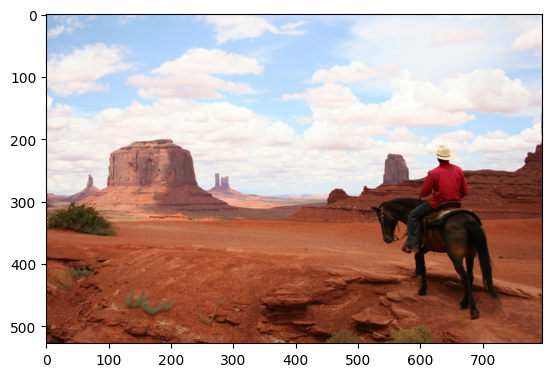

a dog is running through the snow . 


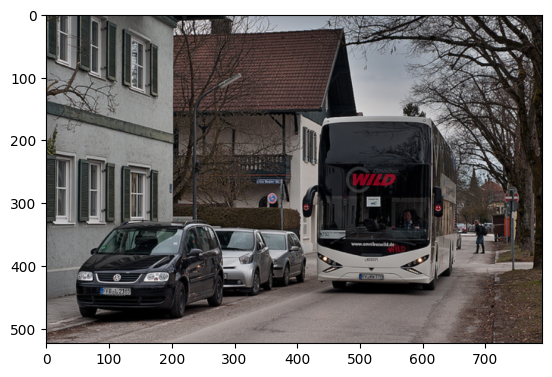

a man in a white shirt is standing on a bench . 


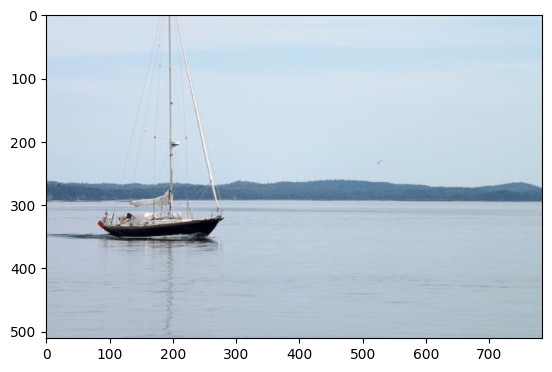

a dog is jumping into the water . 


In [55]:
import matplotlib.pyplot as plt

base_path = './subjective_img/'
def showAndCaptionImage(img, model):
    
    img = Image.open(base_path + img).convert("RGB")
    plt.imshow(img)
    plt.show()
    img = transform(img)
    caption = model.caption_image(img.unsqueeze(0).to(device), dataset.vocab)[1:-1]
    captionStr = ""
    for e in caption:
        captionStr += e + " "
    print(captionStr)


# after 2 epochs
subjective_images = ['horse.png','bus.png','boat.png']
for image in subjective_images:
    showAndCaptionImage(image, model)

In [56]:
load_model = True
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.614569902420044
=> Saving checkpoint


Epoch 2 completed with loss 3.032971143722534


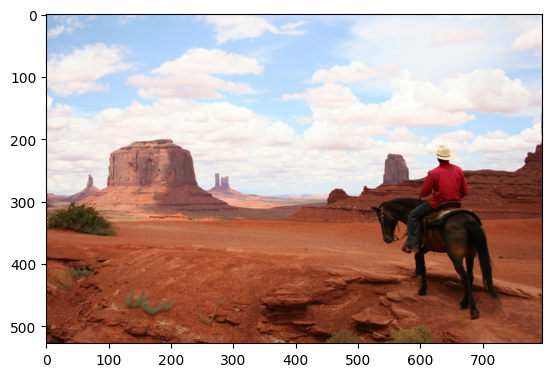

a man is standing on a rock . 


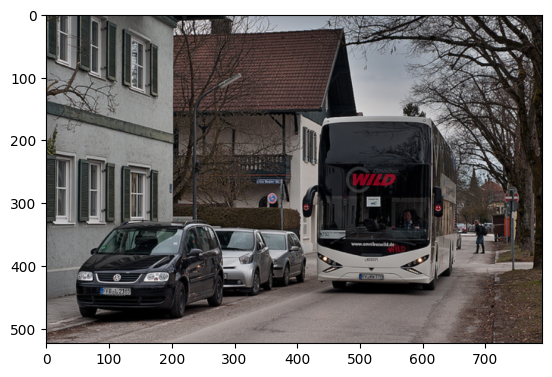

a man in a red shirt is standing on a bench . 


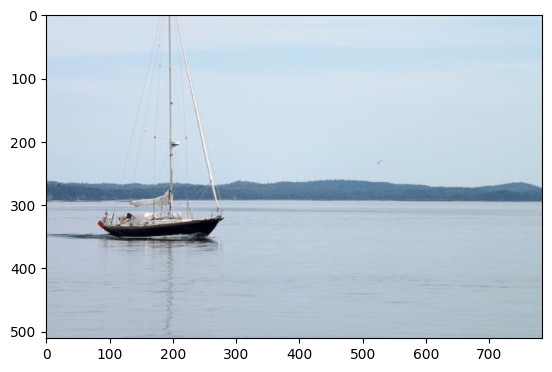

a man is riding a wave . 


In [57]:
# after 4 epochs
subjective_images = ['horse.png','bus.png','boat.png']
for image in subjective_images:
    showAndCaptionImage(image, model)

In [58]:
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 3.208702325820923
=> Saving checkpoint


Epoch 2 completed with loss 3.741774797439575


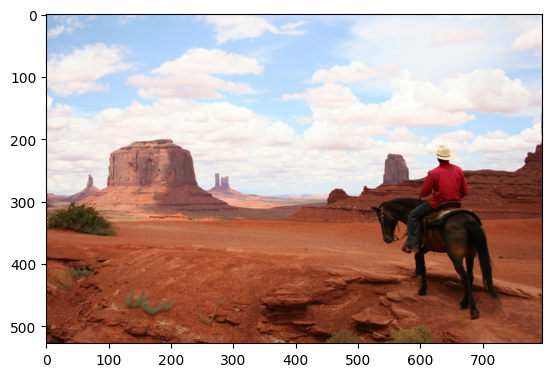

a man is riding a bike on a dirt path . 


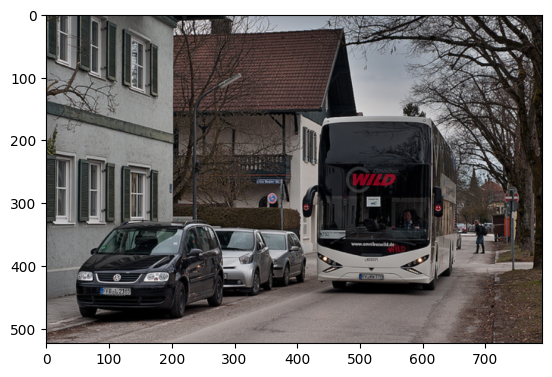

a man in a red shirt is standing on a bench . 


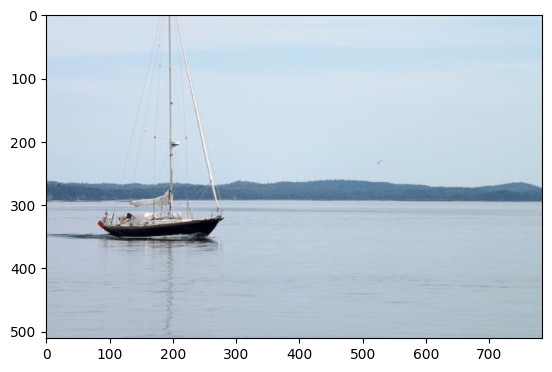

a man is riding a wave . 


In [59]:
# after 6 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [60]:
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.670017957687378
=> Saving checkpoint


Epoch 2 completed with loss 2.999037027359009


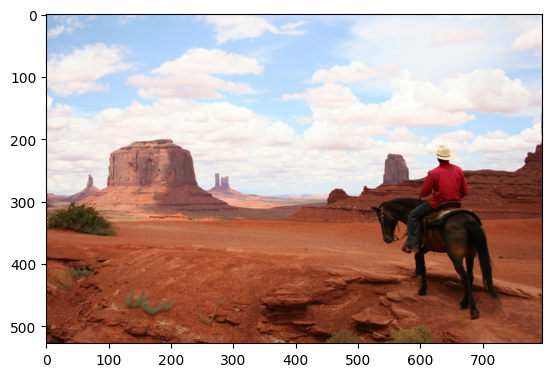

a man is standing on a rock . 


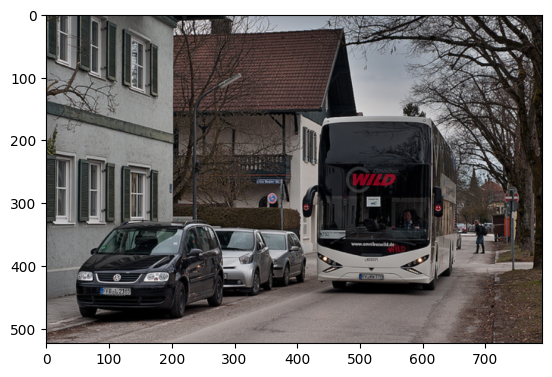

a man in a red shirt is standing on a bench . 


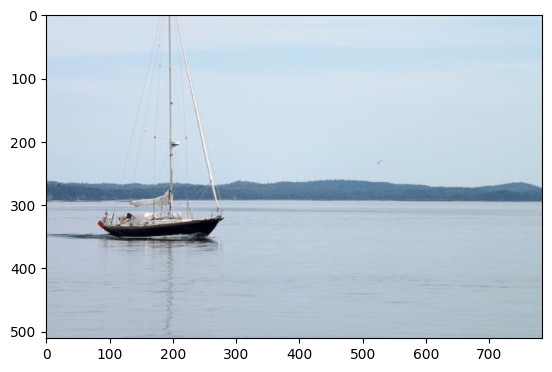

a man is riding a wave . 


In [61]:
# after 8 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [62]:
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.4723334312438965
=> Saving checkpoint


Epoch 2 completed with loss 2.890012741088867


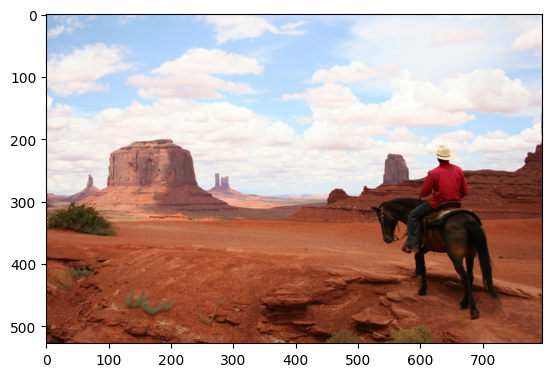

a man is standing on a rock . 


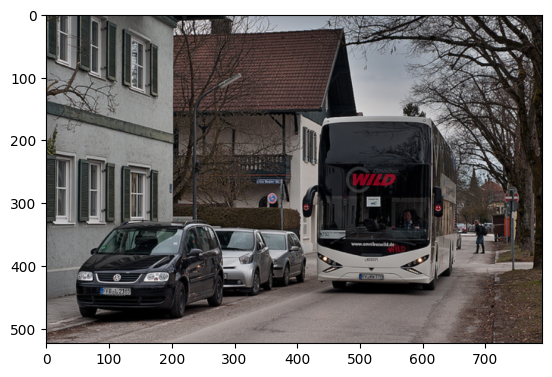

a man in a white shirt is standing on a bench . 


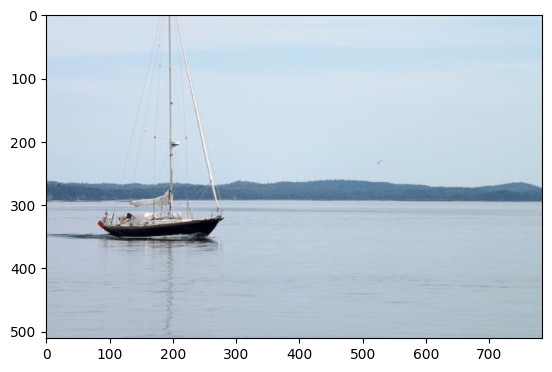

a man is riding a wave . 


In [63]:
# after 10 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [64]:
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.7804598808288574
=> Saving checkpoint


Epoch 2 completed with loss 3.049891471862793


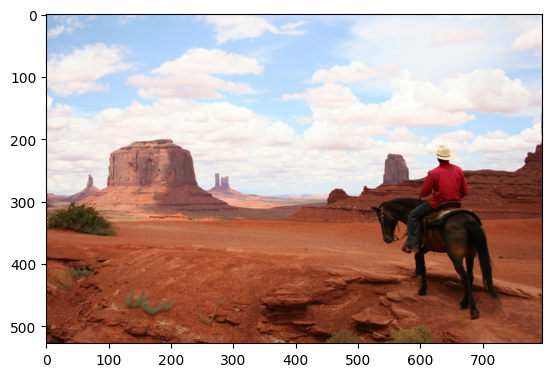

a man is riding a bike on a dirt path . 


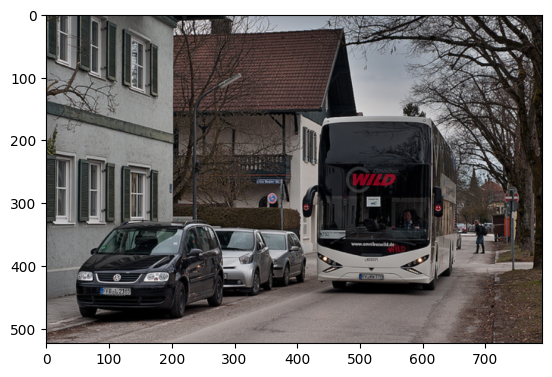

a man in a white shirt and a white shirt and a white shirt and a white shirt and a white shirt . 


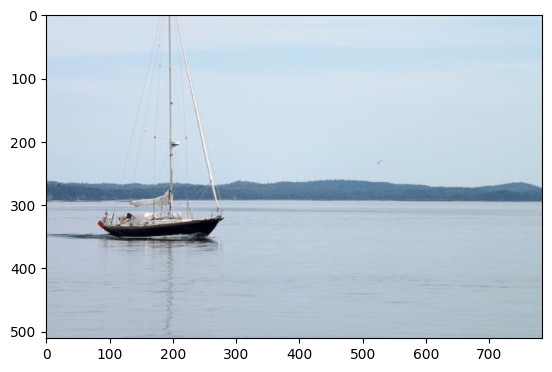

a dog is jumping into the water . 


In [65]:
# after 12 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [66]:
train()

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.423290967941284
=> Saving checkpoint


Epoch 2 completed with loss 2.489668130874634


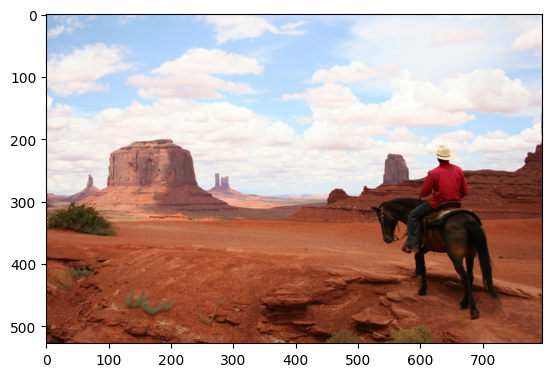

a dog is running through the air . 


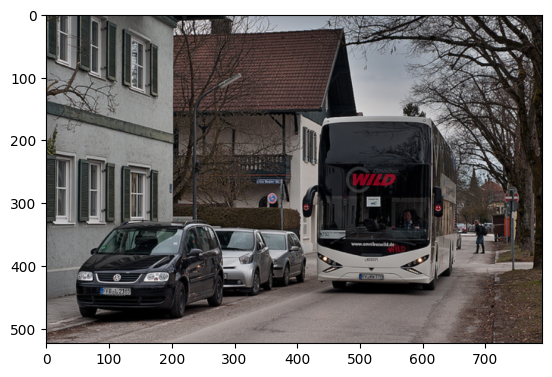

a man in a white shirt and a white shirt and a white shirt and a white shirt and a white shirt . 


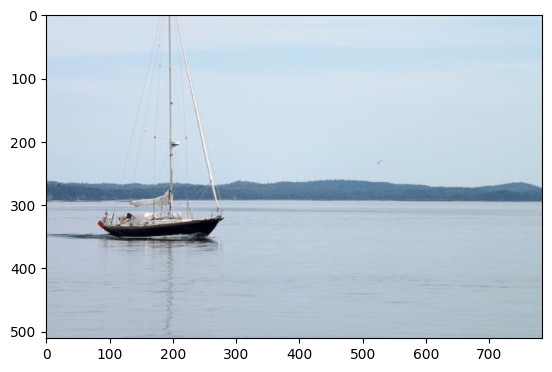

a man is standing on a beach . 


In [67]:
# after 14 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.618940830230713
=> Saving checkpoint


Epoch 2 completed with loss 2.4893112182617188


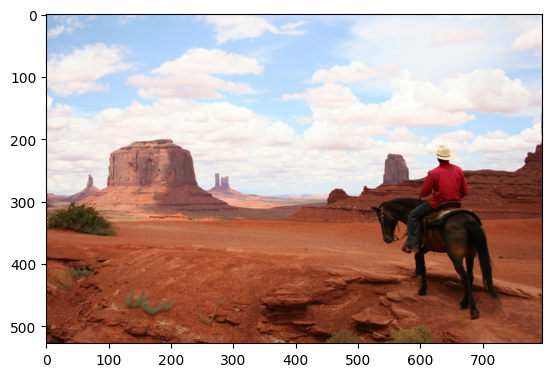

a man is standing on a rock . 


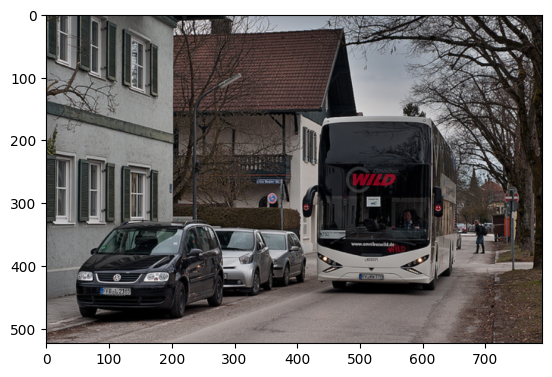

a man in a white shirt and a white shirt and a white shirt and a white shirt and a white shirt . 


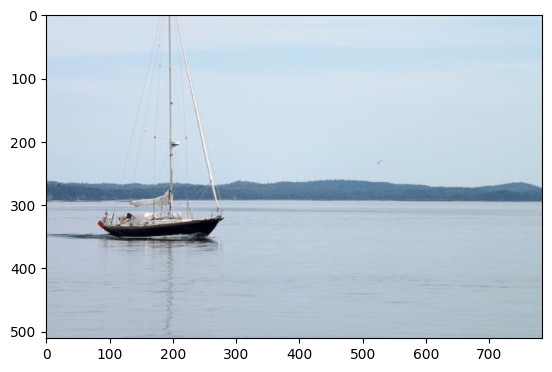

a man is riding a wave . 


In [68]:
train()
# after 16 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.6777327060699463
=> Saving checkpoint


Epoch 2 completed with loss 2.8640475273132324


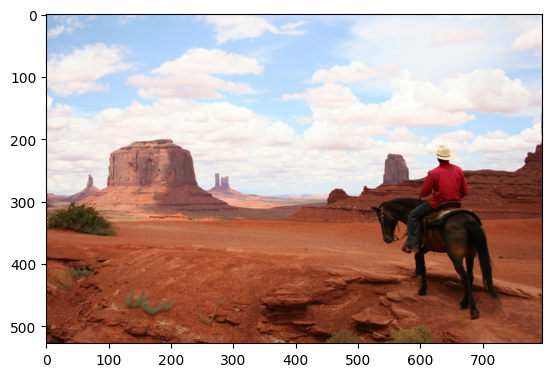

a man is standing on a rock . 


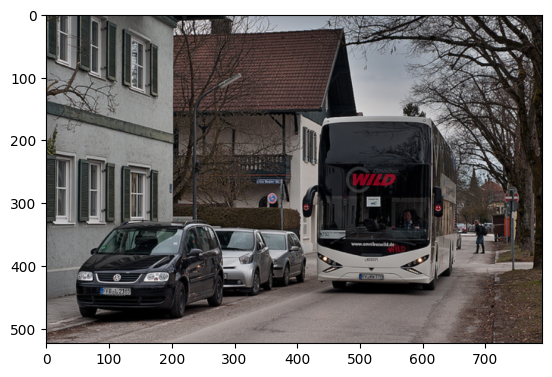

a man in a white shirt and a white shirt and a white shirt and a white shirt and a white shirt . 


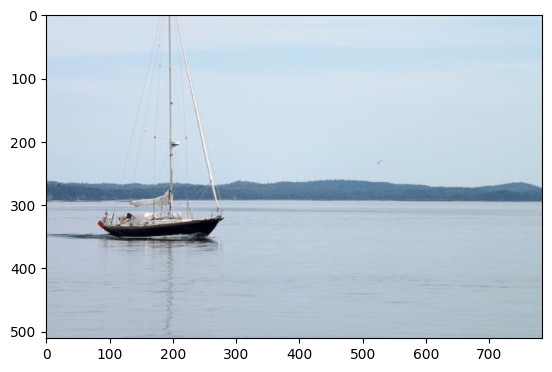

a man is standing on a beach . 


In [69]:
train()
# after 18 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.4244158267974854
=> Saving checkpoint


Epoch 2 completed with loss 2.57773756980896


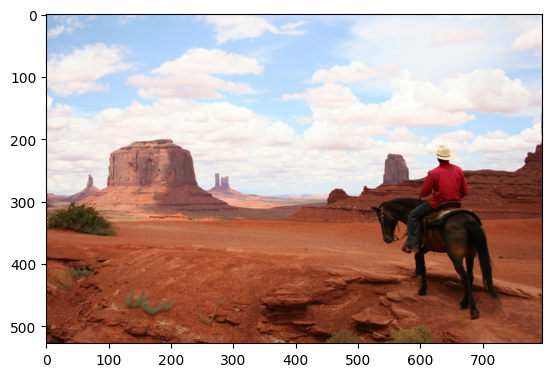

a man is standing on a rock . 


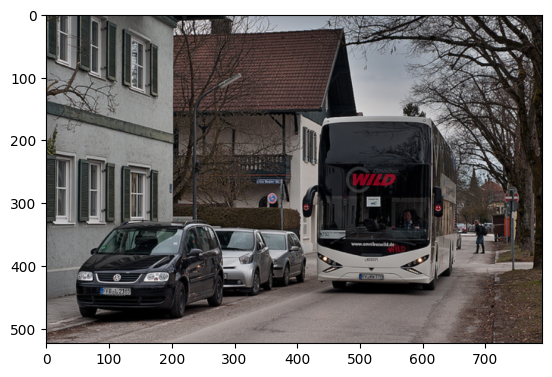

a man in a white shirt and a white shirt and a white shirt and a white shirt and a white shirt . 


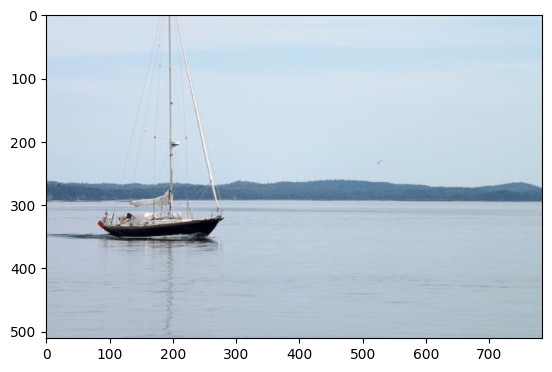

a man is standing on a beach . 


In [70]:
train()
# after 20 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.0826797485351562
=> Saving checkpoint


Epoch 2 completed with loss 2.603449821472168


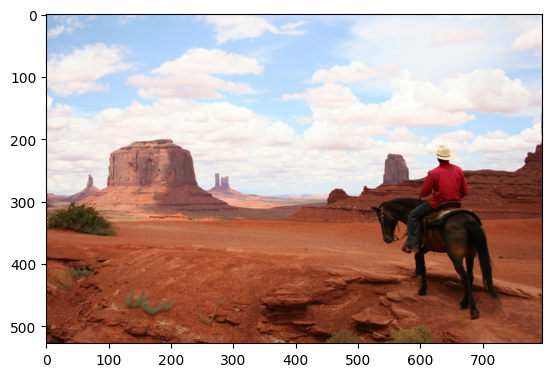

a man is standing on a rock . 


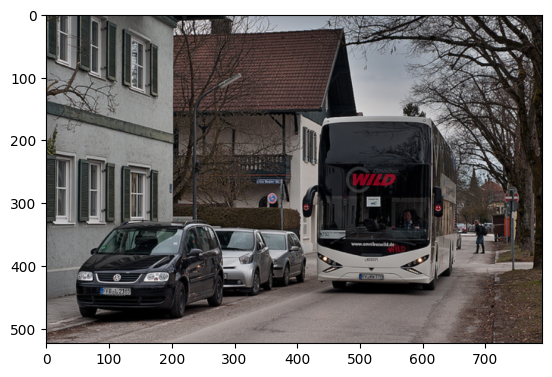

a man in a red shirt is standing on a bench . 


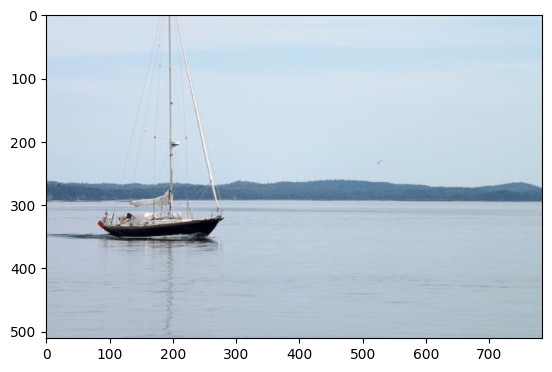

a man is standing on a beach . 


In [71]:
train()
# after 22 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.1137161254882812
=> Saving checkpoint


Epoch 2 completed with loss 1.8209946155548096


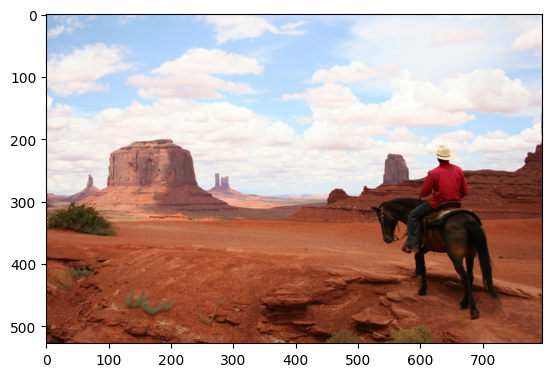

a man is standing on a rock . 


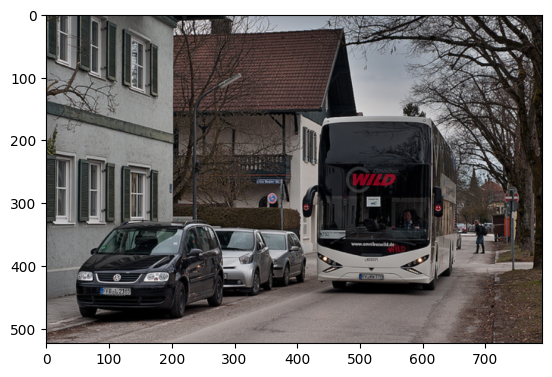

a man in a white shirt is standing on a bench . 


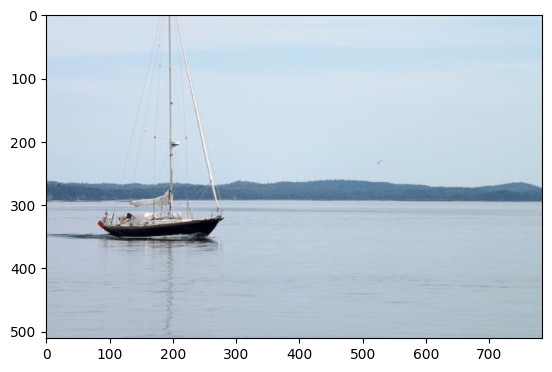

a man is riding a wave . 


In [72]:
train()
# after 24 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.545454978942871
=> Saving checkpoint


Epoch 2 completed with loss 2.190392255783081


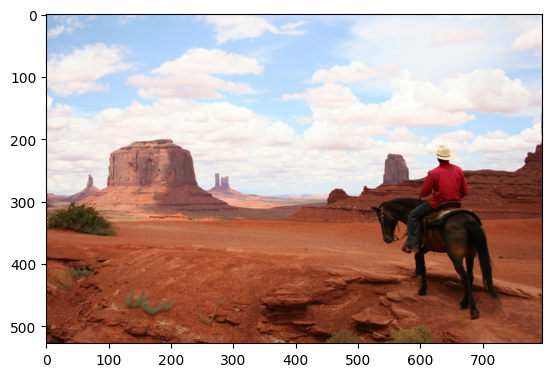

a man is standing on a rock . 


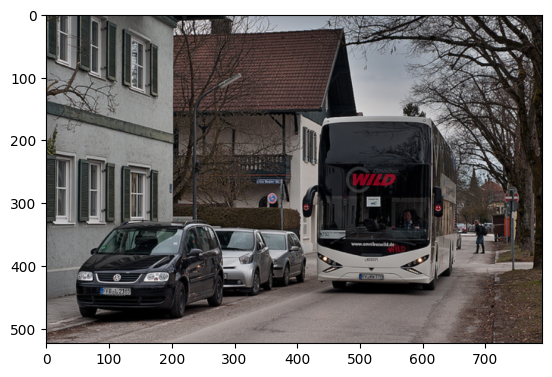

a man in a white shirt is standing on a bench . 


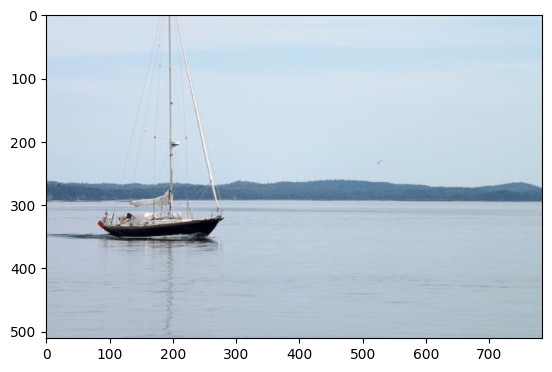

a man is riding a wave . 


In [73]:
train()
# after 26 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 28 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

=> Loading checkpoint
=> Saving checkpoint


Epoch 1 completed with loss 2.4573421478271484
=> Saving checkpoint


In [ ]:
train()
# after 30 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 32 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 34 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 36 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 38 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)

In [ ]:
train()
# after 40 epochs
for image in subjective_images:
    showAndCaptionImage(image, model)